In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import plotly.express as px
import seaborn as sns

from Helper_Functions import *

plt.style.use('seaborn')

In [2]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')

In [3]:
train.head()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,target
0,1,0.670390,0.811300,0.643968,0.291791,0.284117,0.855953,0.890700,0.285542,0.558245,0.779418,0.921832,0.866772,0.878733,0.305411,7.243043
1,3,0.388053,0.621104,0.686102,0.501149,0.643790,0.449805,0.510824,0.580748,0.418335,0.432632,0.439872,0.434971,0.369957,0.369484,8.203331
2,4,0.834950,0.227436,0.301584,0.293408,0.606839,0.829175,0.506143,0.558771,0.587603,0.823312,0.567007,0.677708,0.882938,0.303047,7.776091
3,5,0.820708,0.160155,0.546887,0.726104,0.282444,0.785108,0.752758,0.823267,0.574466,0.580843,0.769594,0.818143,0.914281,0.279528,6.957716
4,8,0.935278,0.421235,0.303801,0.880214,0.665610,0.830131,0.487113,0.604157,0.874658,0.863427,0.983575,0.900464,0.935918,0.435772,7.951046


In [4]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300000 entries, 0 to 299999
Data columns (total 16 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   id      300000 non-null  int64  
 1   cont1   300000 non-null  float64
 2   cont2   300000 non-null  float64
 3   cont3   300000 non-null  float64
 4   cont4   300000 non-null  float64
 5   cont5   300000 non-null  float64
 6   cont6   300000 non-null  float64
 7   cont7   300000 non-null  float64
 8   cont8   300000 non-null  float64
 9   cont9   300000 non-null  float64
 10  cont10  300000 non-null  float64
 11  cont11  300000 non-null  float64
 12  cont12  300000 non-null  float64
 13  cont13  300000 non-null  float64
 14  cont14  300000 non-null  float64
 15  target  300000 non-null  float64
dtypes: float64(15), int64(1)
memory usage: 36.6 MB


In [5]:
#notice same mean and std across features
train.describe()

,id,cont1,cont2,cont3,cont4,cont5,cont6,cont7,cont8,cont9,cont10,cont11,cont12,cont13,cont14,target
count,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000,300000.000000
mean,249825.145857,0.506873,0.497898,0.521557,0.515683,0.502022,0.526515,0.487890,0.525163,0.459857,0.520532,0.483926,0.506877,0.553442,0.503713,7.905661
std,144476.732562,0.203976,0.228159,0.200770,0.233035,0.220701,0.217909,0.181096,0.216221,0.196685,0.201854,0.220082,0.218947,0.229730,0.208238,0.733071
min,1.000000,-0.082263,-0.031397,0.020967,0.152761,0.276377,0.066166,-0.097666,0.217260,-0.240604,-0.085046,0.083277,0.088635,0.029950,0.166367,0.000000
25%,124656.500000,0.343078,0.319170,0.344096,0.294935,0.284108,0.356163,0.346600,0.341486,0.330832,0.375465,0.300474,0.310166,0.350472,0.308673,7.329367
50%,249738.500000,0.484005,0.553209,0.551471,0.482880,0.451733,0.470988,0.466825,0.483460,0.416843,0.458877,0.441916,0.486599,0.487707,0.431845,7.940571
75%,374836.250000,0.643789,0.731263,0.648315,0.748705,0.670660,0.694043,0.581292,0.685250,0.575041,0.700292,0.679128,0.694453,0.768479,0.712653,8.470084
max,499999.000000,1.016227,0.859697,1.006955,1.010402,1.034261,1.043858,1.066167,1.024427,1.004114,1.199951,1.022620,1.049025,0.977845,0.868506,10.267569


# Individual Data Xploration

The distribution of the train and test features are visually similar, as a result, using a holdout method as a validation set without any further transformations would suffice to mimic the test data and evaluate our model's performance.

Features are not normally distrbuted, they are multi-modal in nature(ie they have many peaks). This is especially significant with cont2, as there seems to be discrete points between 0.35 and 0.75, which is made more evident in the pairplot below.
we could binarize the features based on their modes and highlight these to the model. we could also apply box-cox transformation to transform the data into a normal distribution

In [6]:
def kde_plot(data, features, titleText, hue=None):

    L = len(features)
    nrow = int(np.ceil(L/4))
    ncol = 5
    remove_last = (nrow * ncol) - L

    fig, axs = plt.subplots(nrow, ncol, figsize=(24,20))
    fig.tight_layout()
    fig.set_facecolor('#e4e4e4')

    while remove_last > 0:
      axs.flat[-remove_last].set_visible(False)
      remove_last -= 1

    fig.subplots_adjust(top = 0.97)
    plt.subplots_adjust(left=0.1,
                    bottom=0.1, 
                    right=0.9,  
                    wspace=0.4, 
                    hspace=0.4)
    i = 1
    for feature in features:
        plt.subplot(nrow, ncol, i)
        ax = sns.kdeplot(data[feature], color="c", shade=True)  
        ax = ax.set_title(f'{feature} KDE Plot')  
        plt.ylabel('Density', fontsize=14, fontweight = 'bold')
        i += 1

    plt.suptitle(titleText, fontsize = 28, fontweight = 'bold', color = 'navy')
    
    plt.show()


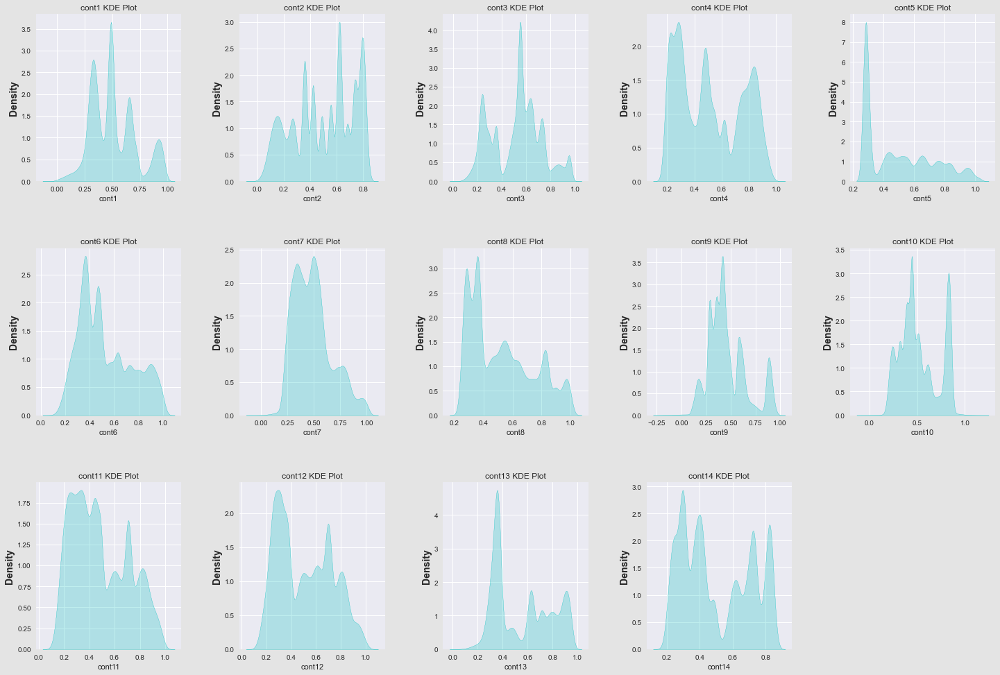

In [7]:
feat_names = [col for col in train.columns if 'cont' in str(col)]
kde_plot(train, feat_names,None, hue=None)

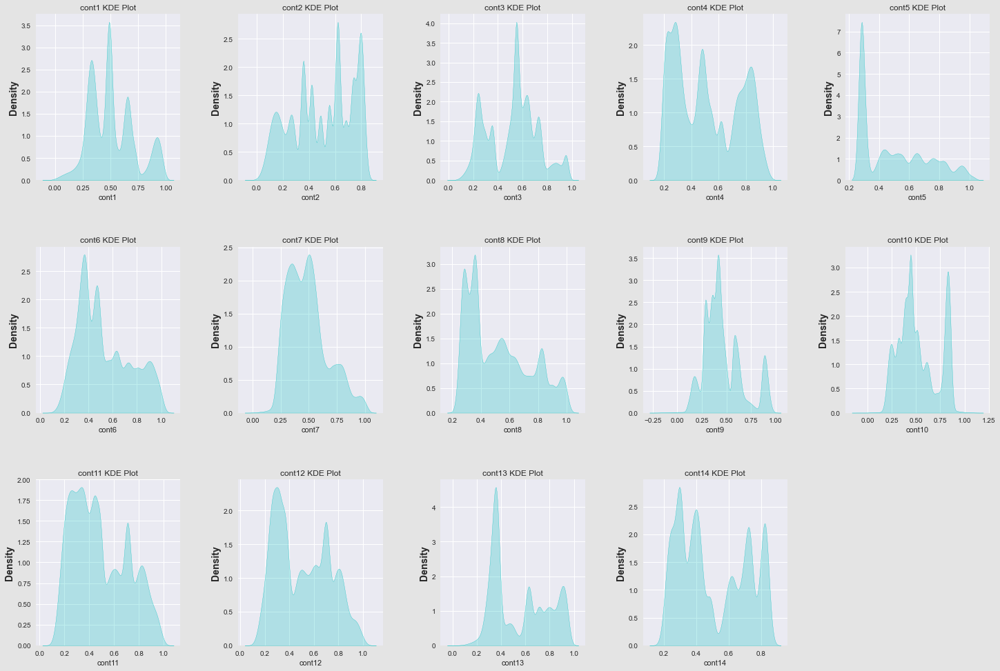

In [8]:
kde_plot(test, feat_names,None, hue=None)

# Standard Deviation of each feature

As seen from the descriptive statistics above, the stanadard deviation are relatively constant throughout the features at 0.2 and hence it would be difficult to leverage on features with higher variance for a better prediction

Text(0.5, 1.0, 'Variance of Features')

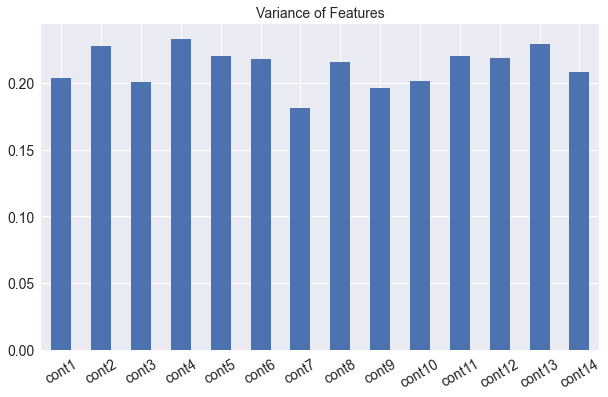

In [9]:
variance = train.iloc[:,1:-1].std(axis=0)
fig = variance.plot(kind='bar',figsize=(10,6),rot=30,fontsize=14)
fig.set_title('Variance of Features',fontsize=14)

# Box Plot

It is evident in the box plot that featurea cont7 and cont9 has outliers present. we could clip the data points out by removing data points that lie out of the 1th to 99th percentile range, what is commonly known as winsorising.

In [10]:
def box_plot(data, features, hue=None):

    L = len(features)
    nrow = int(np.ceil(L/4))
    ncol = 5
    remove_last = (nrow * ncol) - L

    fig, axs = plt.subplots(nrow, ncol, figsize=(24,20))
    fig.tight_layout()
    fig.set_facecolor('#e4e4e4')

    while remove_last > 0:
      axs.flat[-remove_last].set_visible(False)
      remove_last = remove_last - 1

    fig.subplots_adjust(top = 0.97)
    plt.subplots_adjust(left=0.1,
                    bottom=0.01, 
                    right=0.9,  
                    wspace=0.4, 
                    hspace=0.4)
    
    i = 1
    for feature in features:
        plt.subplot(nrow, ncol, i)
        ax = sns.boxplot(x = data[feature],color='c')   
        ax = ax.set_title(f'Boxplot of {feature}',fontsize=14,fontweight='bold')
        plt.ylabel('Values', fontsize=14, fontweight = 'bold')
        i += 1

    plt.show()

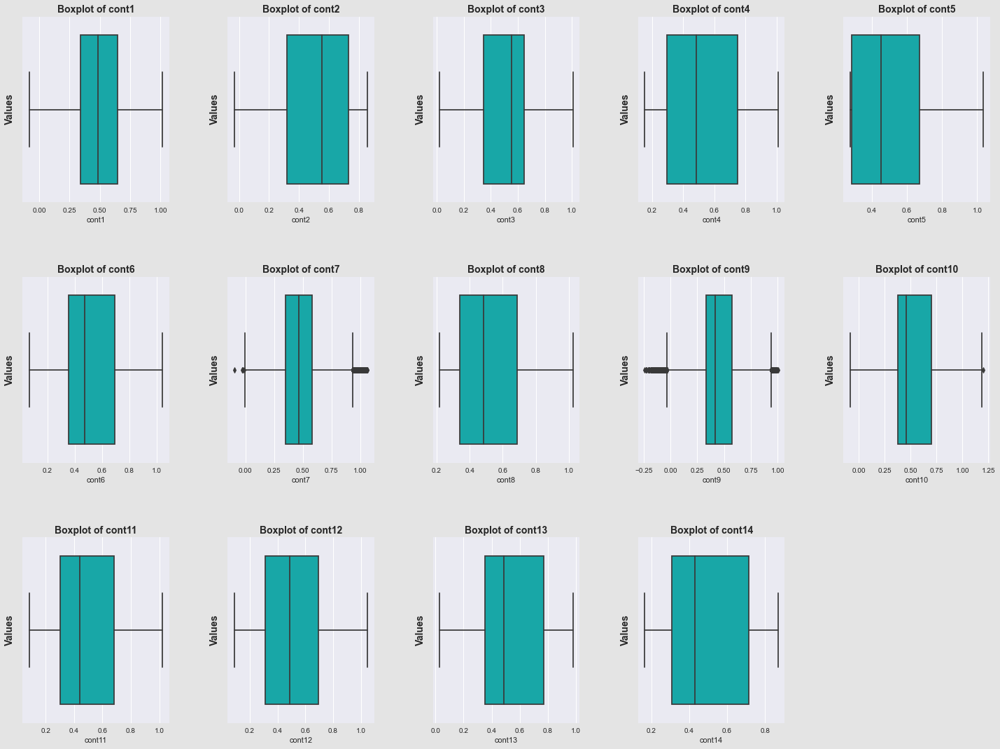

In [11]:
box_plot(train, feat_names)

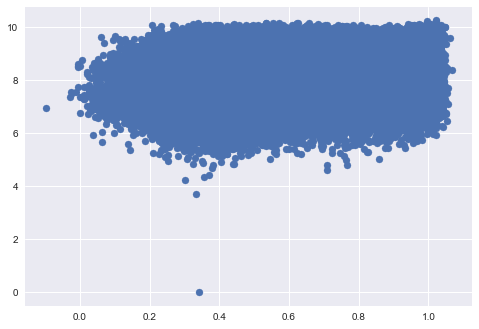

In [12]:
#scatter plot of cont7
fig = plt.scatter(x=train['cont7'],y=train['target'])

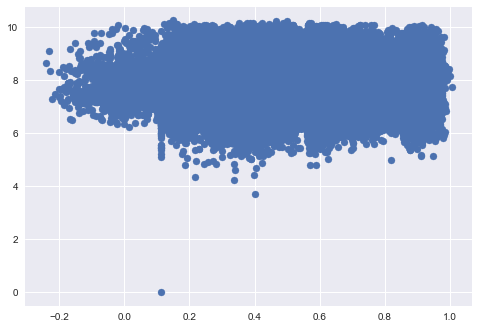

In [13]:
#scatter plot of 9
fig = plt.scatter(x=train['cont9'],y=train['target'])

# Relationship between plots

Pairwise Plot - to identify visible correlations

In [134]:
#sns.pairplot(train[1:])

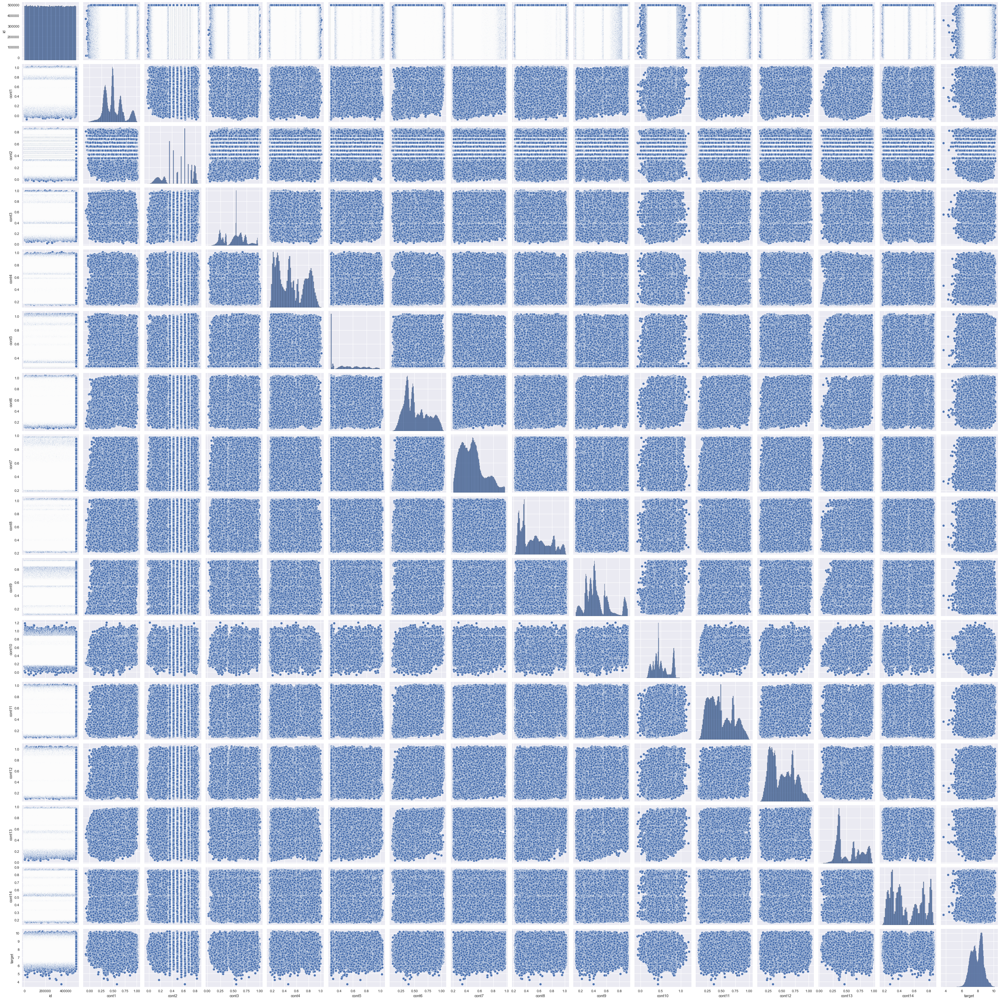

# Correlation Heat Map

From the correlation plot and the VIF values, it could be seen that cont1 and cont6 have highe correlation with the rest of the features. We could attempt to remove these features in a bid to improve linear regression model's stability by reducing the variance. 

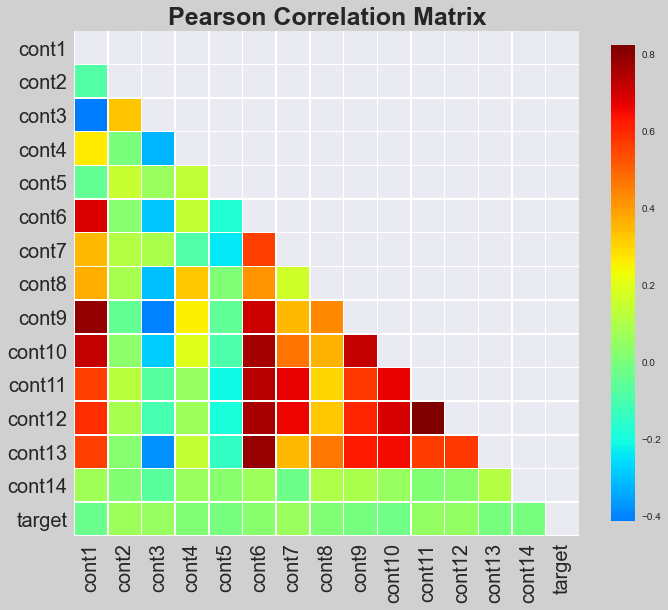

In [20]:
correlation = train.iloc[:,1:].corr()

fig,ax = plt.subplots(1,1,figsize=(10,10))
plt.title('Pearson Correlation Matrix', fontweight='bold', fontsize=25)
fig.set_facecolor('#d0d0d0') 

mask = np.triu(np.ones_like(correlation, dtype = bool))
sns.heatmap(correlation,annot = False, center = 0, cmap = 'jet',mask=mask, linewidths = .5, square = True, cbar_kws = {"shrink": .70})
ax.set_xticklabels(ax.get_xticklabels(), fontfamily = 'sans', rotation = 90, fontsize = 20)
ax.set_yticklabels(ax.get_yticklabels(), fontfamily = 'sans', rotation = 0, fontsize = 20)

plt.tight_layout()
plt.show()

implementing Variance Inflation Factor

VIF is a measure of the strength of the correlation between the varrious independent variables. its measures how much the varicance of a coefficient is inlfated because of its linear dependencie with other factors

VIF=1 --> there is no correlation between the variables

1<VIF<5 --> there is a moderate correlation between the variables

5<VIF<10 --> there is a high correlation between the variables

VIF>10 --> super super high correlation between the variable

In [58]:
def VIF(df, features):
    """
    df --> dataframe with values of the features
    features --> list of feature names
    """
    vif_scores = {}
    
    for feature in features:
        rest_of_features = [feat for feat in features if feat!=feature]
        X,y = df[rest_of_features], df[feature]
        lr = LinearRegression()
        r_squared = lr.fit(X=X,y=y).score(X=X,y=y)
        
        vif = 1/(1-r_squared)
        vif_scores[feature] = vif
    return vif_scores
    

Text(0.5, 1.0, 'VIF Scores of Features')

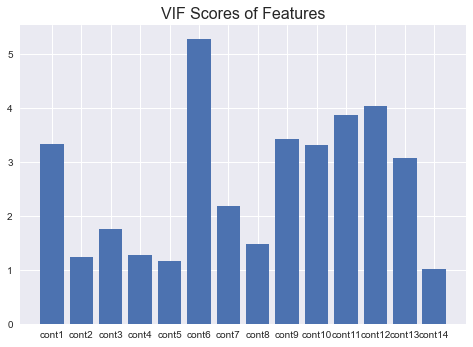

In [95]:
vif_scores = VIF(train,feat_names)
plt.bar(x=vif_scores.keys(),height=vif_scores.values())
plt.title('VIF Scores of Features',fontsize=16)

remove cont1 and cont6 and see if there is an improvement(ie lower) to VIF scores

Text(0.5, 1.0, 'New VIF Scores of Features without cont6')

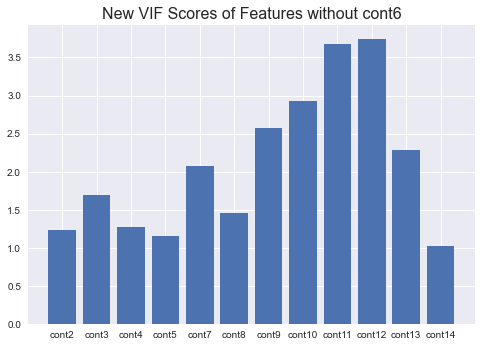

In [108]:
new_feat_names = [feat for feat in feat_names if feat not in('cont6','cont1')]
vif_scores = VIF(train,new_feat_names)
plt.bar(x=vif_scores.keys(),height=vif_scores.values())
plt.title('New VIF Scores of Features without cont6',fontsize=16)

Correlation plot without cont1 and cont6

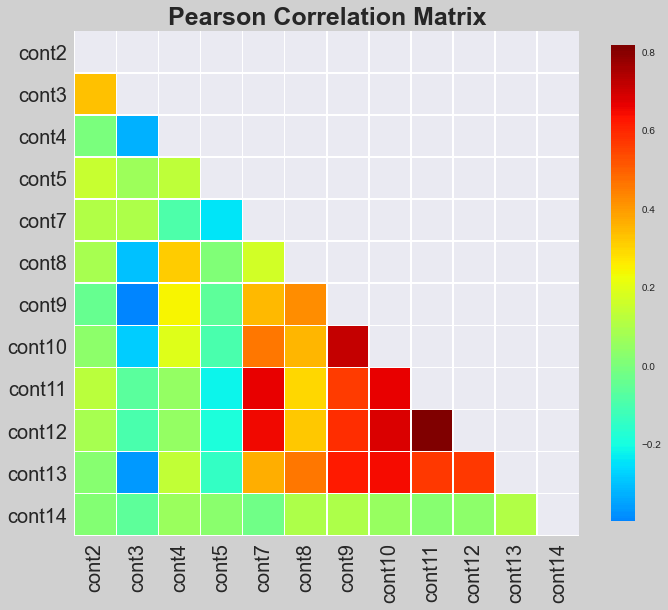

In [110]:
correlation = train[new_feat_names].corr()

fig,ax = plt.subplots(1,1,figsize=(10,10))
plt.title('Pearson Correlation Matrix', fontweight='bold', fontsize=25)
fig.set_facecolor('#d0d0d0') 

mask = np.triu(np.ones_like(correlation, dtype = bool))
sns.heatmap(correlation,annot = False, center = 0, cmap = 'jet',mask=mask, linewidths = .5, square = True, cbar_kws = {"shrink": .70})
ax.set_xticklabels(ax.get_xticklabels(), fontfamily = 'sans', rotation = 90, fontsize = 20)
ax.set_yticklabels(ax.get_yticklabels(), fontfamily = 'sans', rotation = 0, fontsize = 20)

plt.tight_layout()
plt.show()